### Steps of PD Modeling
1. Data Preparation
2. Variable Selection
3. Model Development
4. Model Validation
5. Calibration
6. Independent Validation
7. Supervisory Approval
8. Model Implementation : Roll out to users
9. Periodic Monitoring
10. Post Implementation Validation : Backtesting and Benchmarking
11. Model Refinement (if any issue)

# Import Libraries

In [1]:
import numpy as np
import pandas as pd

# Loading the Data and Selecting the Features

### Import Data

In [2]:
loan_data_inputs_train = pd.read_csv('loan_data_inputs_train.csv', index_col = 0)
loan_data_targets_train = pd.read_csv('loan_data_targets_train.csv', index_col = 0, header = None)
loan_data_inputs_test = pd.read_csv('loan_data_inputs_test.csv', index_col = 0)
loan_data_targets_test = pd.read_csv('loan_data_targets_test.csv', index_col = 0, header = None)

# loan_data_inputs_train = pd.read_csv('Dataset/loan_data_inputs_train.csv', index_col = 0)
# loan_data_targets_train = pd.read_csv('Dataset/loan_data_targets_train.csv', index_col = 0, header = None)
# loan_data_inputs_test = pd.read_csv('Dataset/loan_data_inputs_test.csv', index_col = 0)
# loan_data_targets_test = pd.read_csv('Dataset/loan_data_targets_test.csv', index_col = 0, header = None)

### Explore Data

In [3]:
loan_data_inputs_train.head(3)

,Unnamed: 0.1,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
403678,403678,14560583,16622883,24000,24000,24000.0,60 months,11.99,533.75,B,...,0,0,0,1,0,0,0,0,0,0
241492,241492,34303344,36966688,30000,30000,30000.0,60 months,12.39,673.27,C,...,0,0,0,1,0,0,0,0,0,0
15864,15864,737124,934233,2400,2400,2400.0,36 months,13.49,81.44,C,...,0,0,0,1,0,0,0,0,0,0


In [4]:
loan_data_targets_train.head(3)

,1
0,
403678,1
241492,1
15864,0


In [5]:
print("Testing data input shape: ",loan_data_inputs_test.shape)
print("Testing data input shape: ",loan_data_inputs_test.shape)

print("Training data target shape: ",loan_data_targets_train.shape)
print("Testing data target shape: ",loan_data_targets_test.shape)

Testing data input shape:  (93257, 324)
Testing data input shape:  (93257, 324)
Training data target shape:  (373028, 1)
Testing data target shape:  (93257, 1)


### Selecting the Features

In [6]:
Feature_list=[
# Credit Modeling Grade Options
'grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
    
# Home ownership type
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
    
# Address_state groups
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
    
# Varification Status
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
    
# Purpose of the Loan
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',

# term
'term:36',
'term:60',

# 
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',

# month Issued Bins:
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
                                                            
# Interest Rate Bins
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',


'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',

                                                            
'delinq_2yrs:0',
'delinq_2yrs:1-3',
'delinq_2yrs:>=4',

# 
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',

# Time since Acount opened
'open_acc:0',
'open_acc:1-3',
'open_acc:4-12',
'open_acc:13-17',
'open_acc:18-22',
'open_acc:23-25',
'open_acc:26-30',
'open_acc:>=31',


# 
'pub_rec:0-2',
'pub_rec:3-4',
'pub_rec:>=5',
                                                            
# 
'total_acc:<=27',
'total_acc:28-51',
'total_acc:>=52',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
                                                            
# 
'total_rev_hi_lim:<=5K',
'total_rev_hi_lim:5K-10K',
'total_rev_hi_lim:10K-20K',
'total_rev_hi_lim:20K-30K',
'total_rev_hi_lim:30K-40K',
'total_rev_hi_lim:40K-55K',
'total_rev_hi_lim:55K-95K',
'total_rev_hi_lim:>95K',
                                                            
# Annual Income Bins
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
                                                            
# 
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',

# Time Features Month Since last record.
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']

In [7]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[: , Feature_list]

In [8]:
# Set dummy variables for reference category
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'delinq_2yrs:>=4',
'inq_last_6mths:>6',
'open_acc:0',
'pub_rec:0-2',
'total_acc:<=27',
'acc_now_delinq:0',
'total_rev_hi_lim:<=5K',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [9]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
403678,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
241492,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
15864,0,0,1,0,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
320277,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
299829,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0


# PD Model Estimation

## Logistic Regression

In [10]:
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
pd.options.display.max_rows = None

In [11]:
reg = LogisticRegression()

In [12]:
inputs_train["mths_since_last_record:>=86"]

403678    0
241492    0
15864     0
320277    0
299829    0
71921     0
375016    0
172049    0
231971    0
335590    0
276210    0
440370    0
264914    1
349448    0
430878    0
241207    0
220821    0
63952     0
282491    0
28769     0
188387    0
435506    0
382361    0
36965     0
335984    0
372628    0
395076    0
360172    0
310703    0
332999    0
430766    0
58354     0
162226    0
393012    0
435668    0
217154    0
409720    0
285276    0
122740    0
332857    0
411678    0
85085     0
96735     1
406306    0
306166    0
423835    1
330472    0
210585    0
34880     0
177448    0
409957    0
297661    0
52113     0
398688    0
232878    0
412820    0
233801    0
68329     0
458421    0
443744    0
232037    0
47002     0
95966     1
167032    0
209513    0
29138     0
283963    0
11800     0
87042     0
15588     0
12160     0
240890    0
266835    0
177316    0
404471    0
191131    0
166392    0
266313    0
60619     0
252569    0
375402    0
369651    0
459101    0
2138

In [13]:
inputs_train.isna().sum()

grade:A                                0
grade:B                                0
grade:C                                0
grade:D                                0
grade:E                                0
grade:F                                0
home_ownership:OWN                     0
home_ownership:MORTGAGE                0
addr_state:NM_VA                       0
addr_state:NY                          0
addr_state:OK_TN_MO_LA_MD_NC           0
addr_state:CA                          0
addr_state:UT_KY_AZ_NJ                 0
addr_state:AR_MI_PA_OH_MN              0
addr_state:RI_MA_DE_SD_IN              0
addr_state:GA_WA_OR                    0
addr_state:WI_MT                       0
addr_state:TX                          0
addr_state:IL_CT                       0
addr_state:KS_SC_CO_VT_AK_MS           0
addr_state:WV_NH_WY_DC_ME_ID           0
verification_status:Not Verified       0
verification_status:Source Verified    0
purpose:credit_card                    0
purpose:debt_con

In [14]:
reg.fit(inputs_train, loan_data_targets_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [15]:
reg.intercept_

array([-1.45823616])

In [16]:
reg.coef_

array([[ 1.15257407e+00,  9.05980618e-01,  7.02172330e-01,
         5.26537172e-01,  3.67029230e-01,  2.22935373e-01,
         7.79736534e-02,  1.11294330e-01,  4.51420955e-02,
         7.34474639e-02,  6.75753198e-02,  7.46139571e-02,
         8.89631625e-02,  1.56353640e-01,  1.07827384e-01,
         2.01440461e-01,  2.50871929e-01,  2.45897126e-01,
         2.81721306e-01,  3.49422031e-01,  5.05548496e-01,
         8.87954292e-02, -2.03514826e-02,  3.00285946e-01,
         1.89474929e-01,  2.17244457e-01,  2.67547291e-01,
         4.77190073e-02,  7.49627721e-02,  1.01717558e-01,
         1.18489233e-01,  7.92886480e-02,  7.64015738e-02,
         1.24659374e-01,  1.09187401e+00,  8.94284719e-01,
         7.84700248e-01,  5.71855357e-01,  4.10431816e-01,
         1.67979840e-01, -7.42100128e-02,  9.23084064e-01,
         5.84510637e-01,  3.33090274e-01,  1.36864073e-01,
         6.60685392e-02,  2.72096711e-02,  5.65481026e-02,
         1.01059803e-01,  1.31292276e-01,  6.82457641e-0

In [17]:
feature_name = inputs_train.columns.values

In [18]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-1.458236
1,grade:A,1.152574
2,grade:B,0.905981
3,grade:C,0.702172
4,grade:D,0.526537
5,grade:E,0.367029
6,grade:F,0.222935
7,home_ownership:OWN,0.077974
8,home_ownership:MORTGAGE,0.111294
9,addr_state:NM_VA,0.045142


## Build a Logistic Regression Model with P-Values

In [19]:
from sklearn import linear_model
import scipy.stats as stat

class LogisticRegression_with_p_values:
    
    def __init__(self,*args,**kwargs):
        self.model = linear_model.LogisticRegression(*args,**kwargs)

    def fit(self,X,y):
        self.model.fit(X,y)
        denom = (2.0 * (1.0 + np.cosh(self.model.decision_function(X))))
        denom = np.tile(denom,(X.shape[1],1)).T
        F_ij = np.dot((X / denom).T,X)
        Cramer_Rao = np.linalg.inv(F_ij)
        sigma_estimates = np.sqrt(np.diagonal(Cramer_Rao))
        z_scores = self.model.coef_[0] / sigma_estimates
        p_values = [stat.norm.sf(abs(x)) * 2 for x in z_scores]
        self.coef_ = self.model.coef_
        self.intercept_ = self.model.intercept_
        self.p_values = p_values

In [20]:
reg = LogisticRegression_with_p_values()

In [21]:
reg.fit(inputs_train, loan_data_targets_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [22]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-1.458236
1,grade:A,1.152574
2,grade:B,0.905981
3,grade:C,0.702172
4,grade:D,0.526537
5,grade:E,0.367029
6,grade:F,0.222935
7,home_ownership:OWN,0.077974
8,home_ownership:MORTGAGE,0.111294
9,addr_state:NM_VA,0.045142


In [23]:
p_values = reg.p_values

In [24]:
p_values = np.append(np.nan, np.array(p_values))

In [25]:
summary_table['p_values'] = p_values

In [26]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.458236,NaN
1,grade:A,1.152574,2.116908e-36
2,grade:B,0.905981,6.833249e-50
3,grade:C,0.702172,1.978749e-35
4,grade:D,0.526537,1.038150e-22
5,grade:E,0.367029,1.712222e-14
6,grade:F,0.222935,8.120317e-06
7,home_ownership:OWN,0.077974,1.025863e-04
8,home_ownership:MORTGAGE,0.111294,2.122816e-18
9,addr_state:NM_VA,0.045142,1.591007e-01


In [27]:
inputs_train_with_ref_cat = loan_data_inputs_train.loc[: , ['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [28]:
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [29]:
inputs_train = inputs_train_with_ref_cat.drop(ref_categories, axis = 1)
inputs_train.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
403678,0,1,0,0,0,0,1,0,0,0,...,1,0,0,0,1,0,0,0,0,0
241492,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
15864,0,0,1,0,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
320277,0,0,1,0,0,0,0,0,0,0,...,1,0,0,0,1,0,0,0,0,0
299829,0,1,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,1,0


In [30]:
reg2 = LogisticRegression_with_p_values()
reg2.fit(inputs_train, loan_data_targets_train)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [31]:
feature_name = inputs_train.columns.values

In [32]:
summary_table = pd.DataFrame(columns = ['Feature name'], data = feature_name)
summary_table['Coefficients'] = np.transpose(reg2.coef_)
summary_table.index = summary_table.index + 1
summary_table.loc[0] = ['Intercept', reg2.intercept_[0]]
summary_table = summary_table.sort_index()
summary_table

,Feature name,Coefficients
0,Intercept,-1.559713
1,grade:A,1.133851
2,grade:B,0.898369
3,grade:C,0.698130
4,grade:D,0.525358
5,grade:E,0.371593
6,grade:F,0.227312
7,home_ownership:OWN,0.076665
8,home_ownership:MORTGAGE,0.110057
9,addr_state:NM_VA,0.045301


In [33]:
p_values = reg2.p_values
p_values = np.append(np.nan, np.array(p_values))
summary_table['p_values'] = p_values
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.559713,NaN
1,grade:A,1.133851,2.804819e-35
2,grade:B,0.898369,1.669308e-49
3,grade:C,0.698130,1.744289e-35
4,grade:D,0.525358,4.905160e-23
5,grade:E,0.371593,2.174381e-15
6,grade:F,0.227312,3.122110e-06
7,home_ownership:OWN,0.076665,1.286098e-04
8,home_ownership:MORTGAGE,0.110057,3.503981e-18
9,addr_state:NM_VA,0.045301,1.568425e-01


In [34]:
import pickle

In [35]:
pickle.dump(reg2, open('pd_model.sav', 'wb'))

# PD Model Validation (Test)

### Out-of-sample validation (test)

In [36]:
inputs_test_with_ref_cat = loan_data_inputs_test.loc[: , ['grade:A',
'grade:B',
'grade:C',
'grade:D',
'grade:E',
'grade:F',
'grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'home_ownership:OWN',
'home_ownership:MORTGAGE',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'addr_state:NM_VA',
'addr_state:NY',
'addr_state:OK_TN_MO_LA_MD_NC',
'addr_state:CA',
'addr_state:UT_KY_AZ_NJ',
'addr_state:AR_MI_PA_OH_MN',
'addr_state:RI_MA_DE_SD_IN',
'addr_state:GA_WA_OR',
'addr_state:WI_MT',
'addr_state:TX',
'addr_state:IL_CT',
'addr_state:KS_SC_CO_VT_AK_MS',
'addr_state:WV_NH_WY_DC_ME_ID',
'verification_status:Not Verified',
'verification_status:Source Verified',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'purpose:credit_card',
'purpose:debt_consolidation',
'purpose:oth__med__vacation',
'purpose:major_purch__car__home_impr',
'initial_list_status:f',
'initial_list_status:w',
'term:36',
'term:60',
'emp_length:0',
'emp_length:1',
'emp_length:2-4',
'emp_length:5-6',
'emp_length:7-9',
'emp_length:10',
'mths_since_issue_d:<38',
'mths_since_issue_d:38-39',
'mths_since_issue_d:40-41',
'mths_since_issue_d:42-48',
'mths_since_issue_d:49-52',
'mths_since_issue_d:53-64',
'mths_since_issue_d:65-84',
'mths_since_issue_d:>84',
'int_rate:<9.548',
'int_rate:9.548-12.025',
'int_rate:12.025-15.74',
'int_rate:15.74-20.281',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'mths_since_earliest_cr_line:141-164',
'mths_since_earliest_cr_line:165-247',
'mths_since_earliest_cr_line:248-270',
'mths_since_earliest_cr_line:271-352',
'mths_since_earliest_cr_line:>352',
'inq_last_6mths:0',
'inq_last_6mths:1-2',
'inq_last_6mths:3-6',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'acc_now_delinq:>=1',
'annual_inc:<20K',
'annual_inc:20K-30K',
'annual_inc:30K-40K',
'annual_inc:40K-50K',
'annual_inc:50K-60K',
'annual_inc:60K-70K',
'annual_inc:70K-80K',
'annual_inc:80K-90K',
'annual_inc:90K-100K',
'annual_inc:100K-120K',
'annual_inc:120K-140K',
'annual_inc:>140K',
'dti:<=1.4',
'dti:1.4-3.5',
'dti:3.5-7.7',
'dti:7.7-10.5',
'dti:10.5-16.1',
'dti:16.1-20.3',
'dti:20.3-21.7',
'dti:21.7-22.4',
'dti:22.4-35',
'dti:>35',
'mths_since_last_delinq:Missing',
'mths_since_last_delinq:0-3',
'mths_since_last_delinq:4-30',
'mths_since_last_delinq:31-56',
'mths_since_last_delinq:>=57',
'mths_since_last_record:Missing',
'mths_since_last_record:0-2',
'mths_since_last_record:3-20',
'mths_since_last_record:21-31',
'mths_since_last_record:32-80',
'mths_since_last_record:81-86',
'mths_since_last_record:>=86']]

In [37]:
ref_categories = ['grade:G',
'home_ownership:RENT_OTHER_NONE_ANY',
'addr_state:ND_NE_IA_NV_FL_HI_AL',
'verification_status:Verified',
'purpose:educ__sm_b__wedd__ren_en__mov__house',
'initial_list_status:f',
'term:60',
'emp_length:0',
'mths_since_issue_d:>84',
'int_rate:>20.281',
'mths_since_earliest_cr_line:<140',
'inq_last_6mths:>6',
'acc_now_delinq:0',
'annual_inc:<20K',
'dti:>35',
'mths_since_last_delinq:0-3',
'mths_since_last_record:0-2']

In [38]:
inputs_test = inputs_test_with_ref_cat.drop(ref_categories, axis = 1)
inputs_test.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,...,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
421662,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,0,0,0,0
345847,0,0,0,1,0,0,0,0,0,1,...,0,1,0,0,1,0,0,0,0,0
87245,0,0,0,0,1,0,0,1,0,0,...,1,0,0,0,1,0,0,0,0,0
422411,0,0,1,0,0,0,0,1,0,0,...,0,1,0,0,0,0,0,1,0,0
131614,0,0,0,0,0,1,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0


In [39]:
y_hat_test = reg2.model.predict(inputs_test)

In [40]:
y_hat_test

array([1, 1, 1, ..., 1, 1, 1])

In [41]:
y_hat_test_proba = reg2.model.predict_proba(inputs_test)

In [42]:
y_hat_test_proba

array([[0.060668  , 0.939332  ],
       [0.12303259, 0.87696741],
       [0.28467663, 0.71532337],
       ...,
       [0.03792824, 0.96207176],
       [0.14487357, 0.85512643],
       [0.11561164, 0.88438836]])

In [43]:
y_hat_test_proba[: ][: , 1]

array([0.939332  , 0.87696741, 0.71532337, ..., 0.96207176, 0.85512643,
       0.88438836])

In [44]:
y_hat_test_proba = y_hat_test_proba[: ][: , 1]

In [45]:
y_hat_test_proba

array([0.939332  , 0.87696741, 0.71532337, ..., 0.96207176, 0.85512643,
       0.88438836])

In [46]:
loan_data_targets_test_temp = loan_data_targets_test

In [47]:
loan_data_targets_test_temp.reset_index(drop = True, inplace = True)

In [48]:
df_actual_predicted_probs = pd.concat([loan_data_targets_test_temp, pd.DataFrame(y_hat_test_proba)], axis = 1)

In [49]:
df_actual_predicted_probs.shape

(93257, 2)

In [50]:
df_actual_predicted_probs.columns = ['loan_data_targets_test', 'y_hat_test_proba']

In [51]:
df_actual_predicted_probs.index = loan_data_inputs_test.index

In [52]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba
421662,1,0.939332
345847,1,0.876967
87245,1,0.715323
422411,1,0.939179
131614,1,0.674110


### Accuracy and Area under the Curve

In [53]:
tr = 0.9
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [54]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,7390,2888
1,35710,47269


In [55]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.079243,0.030968
1,0.382920,0.506868


In [56]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.5861114983325649

In [57]:
from sklearn.metrics import roc_curve, roc_auc_score

In [58]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.       , 0.       , 0.       , ..., 0.9999027, 1.       ,
        1.       ]),
 array([0.00000000e+00, 1.20512419e-05, 2.28973596e-04, ...,
        9.99987949e-01, 9.99987949e-01, 1.00000000e+00]),
 array([1.99273022, 0.99273022, 0.99061049, ..., 0.371108  , 0.35734813,
        0.34918836]))

In [59]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

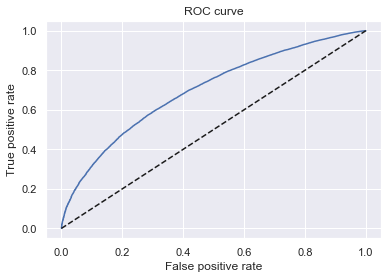

In [61]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [62]:
AUROC = roc_auc_score(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])
AUROC

0.6985283955106242

### Gini and Kolmogorov-Smirnov

In [63]:
df_actual_predicted_probs = df_actual_predicted_probs.sort_values('y_hat_test_proba')

In [64]:
df_actual_predicted_probs.head()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
42341,1,0.349188,0
41422,0,0.357348,0
42416,1,0.371108,0
41922,1,0.388267,0
41998,1,0.388936,0


In [65]:
df_actual_predicted_probs.tail()

,loan_data_targets_test,y_hat_test_proba,y_hat_test
285472,1,0.991833,1
311853,1,0.991948,1
256952,1,0.992362,1
244383,1,0.992382,1
238000,1,0.992730,1


In [66]:
df_actual_predicted_probs = df_actual_predicted_probs.reset_index()

In [67]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test
0,42341,1,0.349188,0
1,41422,0,0.357348,0
2,42416,1,0.371108,0
3,41922,1,0.388267,0
4,41998,1,0.388936,0


In [68]:
df_actual_predicted_probs['Cumulative N Population'] = df_actual_predicted_probs.index + 1
df_actual_predicted_probs['Cumulative N Good'] = df_actual_predicted_probs['loan_data_targets_test'].cumsum()
df_actual_predicted_probs['Cumulative N Bad'] = df_actual_predicted_probs['Cumulative N Population'] - df_actual_predicted_probs['loan_data_targets_test'].cumsum()

In [69]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad
0,42341,1,0.349188,0,1,1,0
1,41422,0,0.357348,0,2,1,1
2,42416,1,0.371108,0,3,2,1
3,41922,1,0.388267,0,4,3,1
4,41998,1,0.388936,0,5,4,1


In [70]:
df_actual_predicted_probs['Cumulative Perc Population'] = df_actual_predicted_probs['Cumulative N Population'] / (df_actual_predicted_probs.shape[0])
df_actual_predicted_probs['Cumulative Perc Good'] = df_actual_predicted_probs['Cumulative N Good'] / df_actual_predicted_probs['loan_data_targets_test'].sum()
df_actual_predicted_probs['Cumulative Perc Bad'] = df_actual_predicted_probs['Cumulative N Bad'] / (df_actual_predicted_probs.shape[0] - df_actual_predicted_probs['loan_data_targets_test'].sum())

In [71]:
df_actual_predicted_probs.head()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
0,42341,1,0.349188,0,1,1,0,0.000011,0.000012,0.000000
1,41422,0,0.357348,0,2,1,1,0.000021,0.000012,0.000097
2,42416,1,0.371108,0,3,2,1,0.000032,0.000024,0.000097
3,41922,1,0.388267,0,4,3,1,0.000043,0.000036,0.000097
4,41998,1,0.388936,0,5,4,1,0.000054,0.000048,0.000097


In [72]:
df_actual_predicted_probs.tail()

,index,loan_data_targets_test,y_hat_test_proba,y_hat_test,Cumulative N Population,Cumulative N Good,Cumulative N Bad,Cumulative Perc Population,Cumulative Perc Good,Cumulative Perc Bad
93252,285472,1,0.991833,1,93253,82975,10278,0.999957,0.999952,1.0
93253,311853,1,0.991948,1,93254,82976,10278,0.999968,0.999964,1.0
93254,256952,1,0.992362,1,93255,82977,10278,0.999979,0.999976,1.0
93255,244383,1,0.992382,1,93256,82978,10278,0.999989,0.999988,1.0
93256,238000,1,0.992730,1,93257,82979,10278,1.000000,1.000000,1.0


Text(0.5, 1.0, 'Gini')

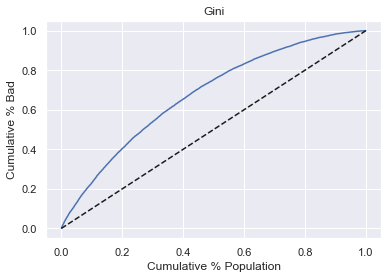

In [73]:
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Bad'])
plt.plot(df_actual_predicted_probs['Cumulative Perc Population'], df_actual_predicted_probs['Cumulative Perc Population'], linestyle = '--', color = 'k')
plt.xlabel('Cumulative % Population')
plt.ylabel('Cumulative % Bad')
plt.title('Gini')

In [74]:
Gini = AUROC * 2 - 1
Gini

0.39705679102124836

Text(0.5, 1.0, 'Kolmogorov-Smirnov')

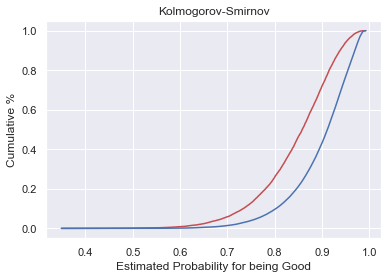

In [75]:
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Bad'], color = 'r')
plt.plot(df_actual_predicted_probs['y_hat_test_proba'], df_actual_predicted_probs['Cumulative Perc Good'], color = 'b')
plt.xlabel('Estimated Probability for being Good')
plt.ylabel('Cumulative %')
plt.title('Kolmogorov-Smirnov')

In [76]:
KS = max(df_actual_predicted_probs['Cumulative Perc Bad'] - df_actual_predicted_probs['Cumulative Perc Good'])
KS

0.28953957879809794

# Applying the PD Model

### Calculating PD of individual accounts

In [77]:
pd.options.display.max_columns = None

In [78]:
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
421662,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
345847,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
87245,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0
422411,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
131614,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0


In [79]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.559713,NaN
1,grade:A,1.133851,2.804819e-35
2,grade:B,0.898369,1.669308e-49
3,grade:C,0.698130,1.744289e-35
4,grade:D,0.525358,4.905160e-23
5,grade:E,0.371593,2.174381e-15
6,grade:F,0.227312,3.122110e-06
7,home_ownership:OWN,0.076665,1.286098e-04
8,home_ownership:MORTGAGE,0.110057,3.503981e-18
9,addr_state:NM_VA,0.045301,1.568425e-01


In [80]:
y_hat_test_proba

array([0.939332  , 0.87696741, 0.71532337, ..., 0.96207176, 0.85512643,
       0.88438836])

### Creating a Scorecard

In [81]:
summary_table

,Feature name,Coefficients,p_values
0,Intercept,-1.559713,NaN
1,grade:A,1.133851,2.804819e-35
2,grade:B,0.898369,1.669308e-49
3,grade:C,0.698130,1.744289e-35
4,grade:D,0.525358,4.905160e-23
5,grade:E,0.371593,2.174381e-15
6,grade:F,0.227312,3.122110e-06
7,home_ownership:OWN,0.076665,1.286098e-04
8,home_ownership:MORTGAGE,0.110057,3.503981e-18
9,addr_state:NM_VA,0.045301,1.568425e-01


In [82]:
ref_categories

['grade:G',
 'home_ownership:RENT_OTHER_NONE_ANY',
 'addr_state:ND_NE_IA_NV_FL_HI_AL',
 'verification_status:Verified',
 'purpose:educ__sm_b__wedd__ren_en__mov__house',
 'initial_list_status:f',
 'term:60',
 'emp_length:0',
 'mths_since_issue_d:>84',
 'int_rate:>20.281',
 'mths_since_earliest_cr_line:<140',
 'inq_last_6mths:>6',
 'acc_now_delinq:0',
 'annual_inc:<20K',
 'dti:>35',
 'mths_since_last_delinq:0-3',
 'mths_since_last_record:0-2']

In [83]:
df_ref_categories = pd.DataFrame(ref_categories, columns = ['Feature name'])
df_ref_categories['Coefficients'] = 0
df_ref_categories['p_values'] = np.nan
df_ref_categories

,Feature name,Coefficients,p_values
0,grade:G,0,NaN
1,home_ownership:RENT_OTHER_NONE_ANY,0,NaN
2,addr_state:ND_NE_IA_NV_FL_HI_AL,0,NaN
3,verification_status:Verified,0,NaN
4,purpose:educ__sm_b__wedd__ren_en__mov__house,0,NaN
5,initial_list_status:f,0,NaN
6,term:60,0,NaN
7,emp_length:0,0,NaN
8,mths_since_issue_d:>84,0,NaN
9,int_rate:>20.281,0,NaN


In [84]:
df_scorecard = pd.concat([summary_table, df_ref_categories])
df_scorecard = df_scorecard.reset_index()
df_scorecard

,index,Feature name,Coefficients,p_values
0,0,Intercept,-1.559713,NaN
1,1,grade:A,1.133851,2.804819e-35
2,2,grade:B,0.898369,1.669308e-49
3,3,grade:C,0.698130,1.744289e-35
4,4,grade:D,0.525358,4.905160e-23
5,5,grade:E,0.371593,2.174381e-15
6,6,grade:F,0.227312,3.122110e-06
7,7,home_ownership:OWN,0.076665,1.286098e-04
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18
9,9,addr_state:NM_VA,0.045301,1.568425e-01


In [85]:
df_scorecard['Original feature name'] = df_scorecard['Feature name'].str.split(':').str[0]

In [86]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name
0,0,Intercept,-1.559713,NaN,Intercept
1,1,grade:A,1.133851,2.804819e-35,grade
2,2,grade:B,0.898369,1.669308e-49,grade
3,3,grade:C,0.698130,1.744289e-35,grade
4,4,grade:D,0.525358,4.905160e-23,grade
5,5,grade:E,0.371593,2.174381e-15,grade
6,6,grade:F,0.227312,3.122110e-06,grade
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state


In [87]:
min_score = 300
max_score = 850

In [88]:
df_scorecard.groupby('Original feature name')['Coefficients'].min()

Original feature name
Intercept                     -1.559713
acc_now_delinq                 0.000000
addr_state                     0.000000
annual_inc                    -0.080910
dti                            0.000000
emp_length                     0.000000
grade                          0.000000
home_ownership                 0.000000
initial_list_status            0.000000
inq_last_6mths                 0.000000
int_rate                       0.000000
mths_since_earliest_cr_line    0.000000
mths_since_issue_d            -0.072530
mths_since_last_delinq         0.000000
mths_since_last_record         0.000000
purpose                        0.000000
term                           0.000000
verification_status           -0.018654
Name: Coefficients, dtype: float64

In [89]:
min_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].min().sum()
min_sum_coef

-1.731807595902392

In [90]:
df_scorecard.groupby('Original feature name')['Coefficients'].max()

Original feature name
Intercept                     -1.559713
acc_now_delinq                 0.091166
addr_state                     0.510807
annual_inc                     0.523478
dti                            0.417816
emp_length                     0.126368
grade                          1.133851
home_ownership                 0.110057
initial_list_status            0.047158
inq_last_6mths                 0.720811
int_rate                       0.952348
mths_since_earliest_cr_line    0.129492
mths_since_issue_d             1.099298
mths_since_last_delinq         0.142478
mths_since_last_record         0.600541
purpose                        0.298101
term                           0.075862
verification_status            0.086822
Name: Coefficients, dtype: float64

In [91]:
max_sum_coef = df_scorecard.groupby('Original feature name')['Coefficients'].max().sum()
max_sum_coef

5.506739317502251

In [92]:
df_scorecard['Score - Calculation'] = df_scorecard['Coefficients'] * (max_score - min_score) / (max_sum_coef - min_sum_coef)
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-1.559713,NaN,Intercept,-118.510291
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038


In [93]:
df_scorecard['Score - Calculation'][0] = ((df_scorecard['Coefficients'][0] - min_sum_coef) / (max_sum_coef - min_sum_coef)) * (max_score - min_score) + min_score
df_scorecard

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation
0,0,Intercept,-1.559713,NaN,Intercept,313.076088
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038


In [94]:
df_scorecard['Score - Preliminary'] = df_scorecard['Score - Calculation'].round()
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary
0,0,Intercept,-1.559713,NaN,Intercept,313.076088,313.0
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363,86.0
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957,68.0
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359,53.0
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838,40.0
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380,28.0
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620,17.0
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171,6.0
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362,8.0
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038,3.0


In [95]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].min().sum()
min_sum_score_prel

300.0

In [96]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Preliminary'].max(). sum()
max_sum_score_prel

853.0

In [97]:
df_scorecard['Difference'] = df_scorecard['Score - Preliminary'] - df_scorecard['Score - Calculation']
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference
0,0,Intercept,-1.559713,NaN,Intercept,313.076088,313.0,-0.076088
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363,86.0,-0.152363
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957,68.0,-0.259957
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359,53.0,-0.045359
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838,40.0,0.082162
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380,28.0,-0.234380
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620,17.0,-0.271620
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171,6.0,0.174829
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362,8.0,-0.362362
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038,3.0,-0.442038


In [98]:
df_scorecard['Score - Final'] = df_scorecard['Score - Preliminary']
df_scorecard['Score - Final'][77] = 16
df_scorecard

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-1.559713,NaN,Intercept,313.076088,313.0,-0.076088,313.0
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363,86.0,-0.152363,86.0
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957,68.0,-0.259957,68.0
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359,53.0,-0.045359,53.0
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838,40.0,0.082162,40.0
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380,28.0,-0.234380,28.0
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620,17.0,-0.271620,17.0
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171,6.0,0.174829,6.0
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362,8.0,-0.362362,8.0
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038,3.0,-0.442038,3.0


In [99]:
min_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].min().sum()
min_sum_score_prel

300.0

In [100]:
max_sum_score_prel = df_scorecard.groupby('Original feature name')['Score - Final'].max(). sum()
max_sum_score_prel

858.0

### Caclulating Credit Score

In [101]:
inputs_test_with_ref_cat.head()

,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
421662,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
345847,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
87245,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0
422411,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
131614,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0


In [102]:
df_scorecard

,index,Feature name,Coefficients,p_values,Original feature name,Score - Calculation,Score - Preliminary,Difference,Score - Final
0,0,Intercept,-1.559713,NaN,Intercept,313.076088,313.0,-0.076088,313.0
1,1,grade:A,1.133851,2.804819e-35,grade,86.152363,86.0,-0.152363,86.0
2,2,grade:B,0.898369,1.669308e-49,grade,68.259957,68.0,-0.259957,68.0
3,3,grade:C,0.698130,1.744289e-35,grade,53.045359,53.0,-0.045359,53.0
4,4,grade:D,0.525358,4.905160e-23,grade,39.917838,40.0,0.082162,40.0
5,5,grade:E,0.371593,2.174381e-15,grade,28.234380,28.0,-0.234380,28.0
6,6,grade:F,0.227312,3.122110e-06,grade,17.271620,17.0,-0.271620,17.0
7,7,home_ownership:OWN,0.076665,1.286098e-04,home_ownership,5.825171,6.0,0.174829,6.0
8,8,home_ownership:MORTGAGE,0.110057,3.503981e-18,home_ownership,8.362362,8.0,-0.362362,8.0
9,9,addr_state:NM_VA,0.045301,1.568425e-01,addr_state,3.442038,3.0,-0.442038,3.0


In [103]:
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat

In [104]:
inputs_test_with_ref_cat_w_intercept.insert(0, 'Intercept', 1)

In [105]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:RENT_OTHER_NONE_ANY,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:f,initial_list_status:w,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,mths_since_issue_d:>84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,int_rate:>20.281,mths_since_earliest_cr_line:<140,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,inq_last_6mths:>6,acc_now_delinq:0,acc_now_delinq:>=1,annual_inc:<20K,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,dti:>35,mths_since_last_delinq:Missing,mths_since_last_delinq:0-3,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:0-2,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86
421662,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0
345847,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0
87245,1,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0
422411,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0
131614,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0


In [106]:
inputs_test_with_ref_cat_w_intercept = inputs_test_with_ref_cat_w_intercept[df_scorecard['Feature name'].values]

In [107]:
inputs_test_with_ref_cat_w_intercept.head()

,Intercept,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,home_ownership:OWN,home_ownership:MORTGAGE,addr_state:NM_VA,addr_state:NY,addr_state:OK_TN_MO_LA_MD_NC,addr_state:CA,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:TX,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,verification_status:Not Verified,verification_status:Source Verified,purpose:credit_card,purpose:debt_consolidation,purpose:oth__med__vacation,purpose:major_purch__car__home_impr,initial_list_status:w,term:36,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d:<38,mths_since_issue_d:38-39,mths_since_issue_d:40-41,mths_since_issue_d:42-48,mths_since_issue_d:49-52,mths_since_issue_d:53-64,mths_since_issue_d:65-84,int_rate:<9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate:15.74-20.281,mths_since_earliest_cr_line:141-164,mths_since_earliest_cr_line:165-247,mths_since_earliest_cr_line:248-270,mths_since_earliest_cr_line:271-352,mths_since_earliest_cr_line:>352,inq_last_6mths:0,inq_last_6mths:1-2,inq_last_6mths:3-6,acc_now_delinq:>=1,annual_inc:20K-30K,annual_inc:30K-40K,annual_inc:40K-50K,annual_inc:50K-60K,annual_inc:60K-70K,annual_inc:70K-80K,annual_inc:80K-90K,annual_inc:90K-100K,annual_inc:100K-120K,annual_inc:120K-140K,annual_inc:>140K,dti:<=1.4,dti:1.4-3.5,dti:3.5-7.7,dti:7.7-10.5,dti:10.5-16.1,dti:16.1-20.3,dti:20.3-21.7,dti:21.7-22.4,dti:22.4-35,mths_since_last_delinq:Missing,mths_since_last_delinq:4-30,mths_since_last_delinq:31-56,mths_since_last_delinq:>=57,mths_since_last_record:Missing,mths_since_last_record:3-20,mths_since_last_record:21-31,mths_since_last_record:32-80,mths_since_last_record:81-86,mths_since_last_record:>=86,grade:G,home_ownership:RENT_OTHER_NONE_ANY,addr_state:ND_NE_IA_NV_FL_HI_AL,verification_status:Verified,purpose:educ__sm_b__wedd__ren_en__mov__house,initial_list_status:f,term:60,emp_length:0,mths_since_issue_d:>84,int_rate:>20.281,mths_since_earliest_cr_line:<140,inq_last_6mths:>6,acc_now_delinq:0,annual_inc:<20K,dti:>35,mths_since_last_delinq:0-3,mths_since_last_record:0-2
421662,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0
345847,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
87245,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,0,0,0,0
422411,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0
131614,1,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,1,1,0,0,1,0,0,1,0,0,0,0


In [108]:
scorecard_scores = df_scorecard['Score - Final']

In [109]:
inputs_test_with_ref_cat_w_intercept.shape

(93257, 102)

In [110]:
scorecard_scores.shape

(102,)

In [111]:
scorecard_scores = scorecard_scores.values.reshape(102, 1)

In [112]:
scorecard_scores.shape

(102, 1)

In [113]:
y_scores = inputs_test_with_ref_cat_w_intercept.dot(scorecard_scores)

In [114]:
y_scores.head()

,0
421662,642.0
345847,583.0
87245,501.0
422411,641.0
131614,487.0


In [115]:
y_scores.tail()

,0
36508,594.0
119856,542.0
388862,680.0
167163,566.0
30505,588.0


### From Credit Score to PD

In [116]:
sum_coef_from_score = ((y_scores - min_score) / (max_score - min_score)) * (max_sum_coef - min_sum_coef) + min_sum_coef

In [117]:
y_hat_proba_from_score = np.exp(sum_coef_from_score) / (np.exp(sum_coef_from_score) + 1)
y_hat_proba_from_score.head()

,0
421662,0.940991
345847,0.880034
87245,0.713727
422411,0.940256
131614,0.674651


In [118]:
y_hat_test_proba[0: 5]

array([0.939332  , 0.87696741, 0.71532337, 0.93917932, 0.67411024])

In [119]:
df_actual_predicted_probs['y_hat_test_proba'].head()

0    0.349188
1    0.357348
2    0.371108
3    0.388267
4    0.388936
Name: y_hat_test_proba, dtype: float64

### Setting Cut-offs

In [120]:
tr = 0.9
df_actual_predicted_probs['y_hat_test'] = np.where(df_actual_predicted_probs['y_hat_test_proba'] > tr, 1, 0)

In [121]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted'])

Predicted,0,1
Actual,,
0,7390,2888
1,35710,47269


In [148]:
pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]

Predicted,0,1
Actual,,
0,0.079243,0.030968
1,0.382920,0.506868


In [123]:
(pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[0, 0] + (pd.crosstab(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test'],
           rownames = ['Actual'], colnames = ['Predicted']) / df_actual_predicted_probs.shape[0]).iloc[1, 1]

0.5861114983325649

In [124]:
from sklearn.metrics import roc_curve, roc_auc_score

In [125]:
roc_curve(df_actual_predicted_probs['loan_data_targets_test'], df_actual_predicted_probs['y_hat_test_proba'])

(array([0.       , 0.       , 0.       , ..., 0.9999027, 1.       ,
        1.       ]),
 array([0.00000000e+00, 1.20512419e-05, 2.28973596e-04, ...,
        9.99987949e-01, 9.99987949e-01, 1.00000000e+00]),
 array([1.99273022, 0.99273022, 0.99061049, ..., 0.371108  , 0.35734813,
        0.34918836]))

In [126]:
fpr, tpr, thresholds = roc_curve(df_actual_predicted_probs['loan_data_targets_test'],
                                 df_actual_predicted_probs['y_hat_test_proba'])

In [127]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()

Text(0.5, 1.0, 'ROC curve')

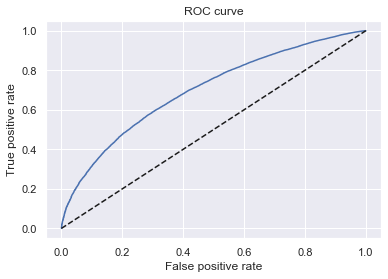

In [128]:
plt.plot(fpr, tpr)
plt.plot(fpr, fpr, linestyle = '--', color = 'k')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')

In [129]:
thresholds

array([1.99273022, 0.99273022, 0.99061049, ..., 0.371108  , 0.35734813,
       0.34918836])

In [130]:
thresholds.shape

(17348,)

In [131]:
df_cutoffs = pd.concat([pd.DataFrame(thresholds), pd.DataFrame(fpr), pd.DataFrame(tpr)], axis = 1)

In [132]:
df_cutoffs.columns = ['thresholds', 'fpr', 'tpr']

In [133]:
df_cutoffs.head()

,thresholds,fpr,tpr
0,1.992730,0.000000,0.000000
1,0.992730,0.000000,0.000012
2,0.990610,0.000000,0.000229
3,0.990562,0.000097,0.000229
4,0.989340,0.000097,0.001024


In [134]:
df_cutoffs['thresholds'][0] = 1 - 1 / np.power(10, 16)

In [135]:
df_cutoffs['Score'] = ((np.log(df_cutoffs['thresholds'] / (1 - df_cutoffs['thresholds'])) - min_sum_coef) * ((max_score - min_score) / (max_sum_coef - min_sum_coef)) + min_score).round()

In [136]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,0.000000,3223.0
1,0.992730,0.000000,0.000012,805.0
2,0.990610,0.000000,0.000229,786.0
3,0.990562,0.000097,0.000229,785.0
4,0.989340,0.000097,0.001024,776.0


In [137]:
df_cutoffs['Score'][0] = max_score

In [138]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score
0,1.000000,0.000000,0.000000,850.0
1,0.992730,0.000000,0.000012,805.0
2,0.990610,0.000000,0.000229,786.0
3,0.990562,0.000097,0.000229,785.0
4,0.989340,0.000097,0.001024,776.0


In [139]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score
17343,0.413650,0.999708,0.999952,405.0
17344,0.402947,0.999903,0.999952,402.0
17345,0.371108,0.999903,0.999988,392.0
17346,0.357348,1.000000,0.999988,387.0
17347,0.349188,1.000000,1.000000,384.0


In [140]:
def n_approved(p):
    return np.where(df_actual_predicted_probs['y_hat_test_proba'] >= p, 1, 0).sum()

In [141]:
df_cutoffs['N Approved'] = df_cutoffs['thresholds'].apply(n_approved)
df_cutoffs['N Rejected'] = df_actual_predicted_probs['y_hat_test_proba'].shape[0] - df_cutoffs['N Approved']
df_cutoffs['Approval Rate'] = df_cutoffs['N Approved'] / df_actual_predicted_probs['y_hat_test_proba'].shape[0]
df_cutoffs['Rejection Rate'] = 1 - df_cutoffs['Approval Rate']

In [142]:
df_cutoffs.head()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
0,1.000000,0.000000,0.000000,850.0,0,93257,0.000000,1.000000
1,0.992730,0.000000,0.000012,805.0,1,93256,0.000011,0.999989
2,0.990610,0.000000,0.000229,786.0,19,93238,0.000204,0.999796
3,0.990562,0.000097,0.000229,785.0,20,93237,0.000214,0.999786
4,0.989340,0.000097,0.001024,776.0,86,93171,0.000922,0.999078


In [143]:
df_cutoffs.tail()

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
17343,0.413650,0.999708,0.999952,405.0,93250,7,0.999925,0.000075
17344,0.402947,0.999903,0.999952,402.0,93252,5,0.999946,0.000054
17345,0.371108,0.999903,0.999988,392.0,93255,2,0.999979,0.000021
17346,0.357348,1.000000,0.999988,387.0,93256,1,0.999989,0.000011
17347,0.349188,1.000000,1.000000,384.0,93257,0,1.000000,0.000000


In [144]:
df_cutoffs.iloc[5000: 6200, ]

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
5000,0.904969,0.256665,0.540583,603.0,47495,45762,0.509292,0.490708
5001,0.904872,0.256665,0.541137,603.0,47541,45716,0.509785,0.490215
5002,0.904871,0.256762,0.541137,603.0,47542,45715,0.509796,0.490204
5003,0.904861,0.256762,0.541197,603.0,47547,45710,0.509849,0.490151
5004,0.904859,0.256859,0.541197,603.0,47548,45709,0.509860,0.490140
5005,0.904776,0.256859,0.541848,603.0,47602,45655,0.510439,0.489561
5006,0.904775,0.256957,0.541848,603.0,47603,45654,0.510450,0.489550
5007,0.904767,0.256957,0.541872,603.0,47605,45652,0.510471,0.489529
5008,0.904766,0.257054,0.541872,603.0,47606,45651,0.510482,0.489518
5009,0.904748,0.257054,0.542005,603.0,47617,45640,0.510600,0.489400


In [145]:
df_cutoffs.iloc[1000: 2000, ]

,thresholds,fpr,tpr,Score,N Approved,N Rejected,Approval Rate,Rejection Rate
1000,0.953761,0.048842,0.206510,662.0,17638,75619,0.189133,0.810867
1001,0.953756,0.048842,0.206522,662.0,17639,75618,0.189144,0.810856
1002,0.953756,0.048939,0.206522,662.0,17640,75617,0.189155,0.810845
1003,0.953710,0.048939,0.206835,661.0,17666,75591,0.189434,0.810566
1004,0.953706,0.049037,0.206835,661.0,17667,75590,0.189444,0.810556
1005,0.953689,0.049037,0.206920,661.0,17674,75583,0.189519,0.810481
1006,0.953689,0.049134,0.206920,661.0,17675,75582,0.189530,0.810470
1007,0.953680,0.049134,0.206956,661.0,17678,75579,0.189562,0.810438
1008,0.953680,0.049231,0.206956,661.0,17679,75578,0.189573,0.810427
1009,0.953667,0.049231,0.207076,661.0,17689,75568,0.189680,0.810320


In [146]:
inputs_train_with_ref_cat.to_csv('inputs_train_with_ref_cat.csv')

In [147]:
df_scorecard.to_csv('df_scorecard.csv')